# Amazon Sales Analysis (EDA) 

## Contents:

1. Introduction
2. Problem statement and About Data
3. Importing required libraries and Uploading Data
4. Data Preparation and Cleaning
5. Exploratory Analysis and Visualization
6. Answering the questions.







### Introduction:

In this project we are going to analyze the Amazon Sales data for the Ineuron Internship project.The reason behind choosing this topic was wanting to gain experience in doing real world projects and learn something abou the Sales domain.We will get answers of some interesting and important questions from this data by doing EDA (Exploratory Data Analysis), look upon some important trends.  





### Problem Statement:

Sales management has gained importance to meet increasing competition and the need
for improved methods of distribution to reduce cost and to increase profits. Sales
management today is the most important function in a commercial and business
enterprise.


Do ETL : Extract-Transform-Load some Amazon dataset and find for me
Sales-trend -> month wise , year wise , yearly_month wise
Find key metrics and factors and show the meaningful relationships between attributes.


### About Data:

The data provided is of country **America** of the **Food Category** for the years **2017, 2018, 2019**.
The important thing to note is that **only first 3 months of data is provided for the year 2018** and for the other 2 years the data is fully provided.


#### Importing required libraries and Uploading Data

In [1]:
# Let's import the required libraries to load the data set and perform the EDA.

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from collections import Counter
from itertools import combinations
import warnings
warnings.filterwarnings('ignore')

# To see all the columns of the dataset we run the following line of code:

pd.pandas.set_option('display.max_columns', None)

In [2]:
# Loading the data set
sales_data_df = pd.read_excel('SALESDATA.xlsx')

## Data Preparation and Cleaning

**TODO** - 
1. Data Understanding
2. Data Preparation



#### 1.Data understanding:

- DataFrame head
- Shape
- dtypes
- describe

In [3]:
sales_data_df.head()

,CustKey,DateKey,Discount Amount,Invoice Date,Invoice Number,Item Class,Item Number,Item,Line Number,List Price,Order Number,Promised Delivery Date,Sales Amount,Sales Amount Based on List Price,Sales Cost Amount,Sales Margin Amount,Sales Price,Sales Quantity,Sales Rep,U/M
0,10000481,2017-04-30,-237.91,2017-04-30,100012,NaN,NaN,Urban Large Eggs,2000,0.00,200015,2017-04-30,237.91,0.00,0.0,237.91,237.910,1,184,EA
1,10014802,2017-05-05,425.97,2017-05-05,100034,P01,24336,Fast Low Fat Cookies,2000,219.99,200037,2017-05-05,234.00,659.97,0.0,234.00,78.000,3,117,EA
2,10025248,2017-05-23,340.84,2017-05-23,100080,P01,61762,Carlson Blueberry Yogurt,2000,803.86,200086,2017-05-23,463.02,803.86,0.0,463.02,463.020,1,145,EA
3,10025063,2017-06-02,16812.48,2017-06-02,100093,NaN,62058,Big Time Popsicles,2000,1293.00,200101,2017-05-29,14219.52,31032.00,0.0,14219.52,592.480,24,162,EA
4,10025549,2017-06-02,195.39,2017-06-02,100094,P01,24335,Kiwi Scallops,2000,217.10,200105,2017-06-02,238.81,434.20,0.0,238.81,119.405,2,103,EA


In [4]:
print(sales_data_df.shape)

(65282, 20)


In [5]:
print(sales_data_df.dtypes)

CustKey                                      int64
DateKey                             datetime64[ns]
Discount Amount                            float64
Invoice Date                        datetime64[ns]
Invoice Number                               int64
Item Class                                  object
Item Number                                 object
Item                                        object
Line Number                                  int64
List Price                                 float64
Order Number                                 int64
Promised Delivery Date              datetime64[ns]
Sales Amount                               float64
Sales Amount Based on List Price           float64
Sales Cost Amount                          float64
Sales Margin Amount                        float64
Sales Price                                float64
Sales Quantity                               int64
Sales Rep                                    int64
U/M                            

In [6]:
sales_data_df.describe()

,CustKey,Discount Amount,Invoice Number,Line Number,List Price,Order Number,Sales Amount,Sales Amount Based on List Price,Sales Cost Amount,Sales Margin Amount,Sales Price,Sales Quantity,Sales Rep
count,6.528200e+04,65280.000000,65282.000000,65282.000000,65282.000000,65282.000000,65282.000000,65282.000000,65282.000000,65282.000000,65281.000000,65282.000000,65282.000000
mean,1.001770e+07,1855.574835,216223.662020,23713.849790,514.693380,180583.064352,2852.038373,4707.473613,1660.979228,1191.059145,283.615913,45.084311,137.422398
std,7.176148e+03,9037.140888,94992.281866,32664.024053,449.189182,67593.871116,15164.342107,20696.443785,9556.485250,5860.787502,252.876719,429.661793,26.643936
min,1.000045e+07,-255820.800000,100012.000000,1000.000000,0.000000,100838.000000,200.010000,0.000000,0.000000,-3932.930000,-5000.000000,-1.000000,103.000000
25%,1.001272e+07,246.037500,117931.000000,3000.000000,181.560000,115321.000000,308.387500,561.040000,167.790000,129.950000,100.070000,2.000000,113.000000
50%,1.001966e+07,441.760000,222869.500000,12000.000000,325.190000,203702.000000,553.940000,998.160000,304.500000,246.490000,183.757500,3.000000,134.000000
75%,1.002351e+07,999.760000,314318.750000,32000.000000,803.860000,218576.000000,1280.042500,2315.040000,687.320000,579.530000,448.220000,8.000000,160.000000
max,1.002758e+07,343532.660000,332842.000000,344000.000000,2760.700000,321532.000000,555376.000000,632610.160000,366576.000000,188800.000000,6035.000000,16000.000000,185.000000


#### 2. Data Preparation:

- Dropping irrelavant columns and rows.
- Figuring out and dealing with zero/null values.
- Feature creation.
- Setting columns in helpful order. 



In [7]:
# Figuring out all the null values
print(sales_data_df.isna().sum())

CustKey                                0
DateKey                                0
Discount Amount                        2
Invoice Date                           0
Invoice Number                         0
Item Class                          8289
Item Number                           41
Item                                   0
Line Number                            0
List Price                             0
Order Number                           0
Promised Delivery Date                 0
Sales Amount                           0
Sales Amount Based on List Price       0
Sales Cost Amount                      0
Sales Margin Amount                    0
Sales Price                            1
Sales Quantity                         0
Sales Rep                              0
U/M                                    0
dtype: int64


In [8]:
sales_data_df.columns[(sales_data_df == 0).any()]

Index(['Discount Amount', 'Item Number', 'List Price',
       'Sales Amount Based on List Price', 'Sales Cost Amount',
       'Sales Margin Amount', 'Sales Quantity'],
      dtype='object')

In [9]:
sales_data_df_numeric = sales_data_df.select_dtypes(include='number')

sales_data_df_numeric.columns[(sales_data_df_numeric < 0).any()]

Index(['Discount Amount', 'Sales Margin Amount', 'Sales Price',
       'Sales Quantity'],
      dtype='object')

We can see that there are quiet a few null values in the 'Item Class' feature and some in 'Item Number' and only one in 'Sales Price' and columns that have rows with '0' and 'Negative' as a value in them.

Sales price and columns related to Sales amount are our main features having 'Null values' or '0' or 'Negative' instade of relevant data in these features makes no sense in analysing these rows of data.

So, we are going to handle the null, 0 and negative values accordingly.

In [10]:
# Dropping all the rows with null values in 'Sales Price' column which our main feature and creating a new dataframe.
clean_df=sales_data_df.drop(sales_data_df[sales_data_df['Sales Price'].isna()==True].index)

# Replacing the null values in other features with appropriate values.
clean_df['Item Class'].fillna('N-A', inplace=True)

clean_df['Discount Amount'].fillna(0, inplace=True)

clean_df['Item Number'].fillna('N-A', inplace=True)

In [11]:
# Dropping the irrelavant rows.
clean_df.drop(clean_df[clean_df['List Price'] == 0].index, inplace=True)

clean_df.drop(clean_df[clean_df['Sales Amount Based on List Price'] <= 0].index, inplace=True)

clean_df.drop(clean_df[clean_df['Sales Cost Amount'] == 0].index, inplace=True)

clean_df.drop(clean_df[clean_df['Sales Quantity'] <= 0].index, inplace=True)

clean_df.drop(clean_df[clean_df['Discount Amount'] < 0].index, inplace=True)

clean_df.drop(clean_df[clean_df['Sales Margin Amount'] <= 0].index, inplace=True)

clean_df=clean_df.reset_index(drop=True)

In [12]:
# Checking if there are any null values still remaining.
print(clean_df.isnull().sum())

CustKey                             0
DateKey                             0
Discount Amount                     0
Invoice Date                        0
Invoice Number                      0
Item Class                          0
Item Number                         0
Item                                0
Line Number                         0
List Price                          0
Order Number                        0
Promised Delivery Date              0
Sales Amount                        0
Sales Amount Based on List Price    0
Sales Cost Amount                   0
Sales Margin Amount                 0
Sales Price                         0
Sales Quantity                      0
Sales Rep                           0
U/M                                 0
dtype: int64


In [13]:
# Checking if there are any rows with value 0 still remaining.
clean_df.columns[(clean_df == 0).any()]

Index(['Discount Amount'], dtype='object')

In [14]:
# Checking if there are any negative values still remaining.
clean_df_numeric = clean_df.select_dtypes(include='number')

clean_df_numeric.columns[(clean_df_numeric < 0).any()]

Index([], dtype='object')

Now, after dealing with the null and irrelevant value let's proceed to removing duplicate or any irrlevant columns/features and add required columns/features.

In [15]:
clean_df['DateKey'].equals(clean_df['Invoice Date'])

True

In [16]:
# Extracting Year, MOnth, Quarter, Day from date column.
clean_df['Invoice Year']=pd.DatetimeIndex(clean_df['Invoice Date']).year

clean_df['Invoice Month']=clean_df['Invoice Date'].apply(lambda x: x.strftime('%B'))

clean_df['Invoice Quarter']= clean_df['Invoice Date'].dt.quarter

clean_df['Invoice Day']= clean_df['Invoice Date'].dt.day

clean_df.sort_values(by=['Invoice Year', 'Invoice Quarter', 'Invoice Date'],inplace=True)

In [17]:
# Dropping columns which are not required.
clean_df.drop(['DateKey', 'Promised Delivery Date'], axis=1, inplace=True)

We are done with the cleaning part and now let's prepare the data to do further Exploratory Analysis on it.

In [18]:
sales_df = clean_df[['CustKey', 'Invoice Number', 'Invoice Date', 'Invoice Year', 'Invoice Month', 'Invoice Quarter',
                     'Invoice Day', 'Item Number', 'Item', 'U/M', 'Item Class', 'Line Number', 'Order Number', 'Sales Rep', 
                     'Sales Quantity', 'List Price', 'Sales Price', 'Sales Amount Based on List Price', 'Discount Amount',
                     'Sales Amount','Sales Cost Amount', 'Sales Margin Amount']]

In [19]:
sales_df.head()

,CustKey,Invoice Number,Invoice Date,Invoice Year,Invoice Month,Invoice Quarter,Invoice Day,Item Number,Item,U/M,Item Class,Line Number,Order Number,Sales Rep,Sales Quantity,List Price,Sales Price,Sales Amount Based on List Price,Discount Amount,Sales Amount,Sales Cost Amount,Sales Margin Amount
16454,10009652,119070,2017-01-01,2017,January,1,1,63645,Gorilla 2% Milk,EA,N-A,2000,215893,145,120,2.1500,2.150,258.00,0.00,258.00,235.25,22.75
16455,10009652,119071,2017-01-01,2017,January,1,1,63113,Landslide Columbian Coffee,EA,N-A,3000,215894,145,200,5.3500,5.350,1070.00,0.00,1070.00,892.68,177.32
16456,10017638,119078,2017-01-01,2017,January,1,1,26543,Bravo Fancy Canned Oysters,EA,P01,7000,216510,115,5,140.0200,68.958,700.10,355.31,344.79,208.49,136.30
16457,10021986,119080,2017-01-01,2017,January,1,1,30042,Just Right Regular Ramen Soup,EA,P01,1000,216736,179,1,285.4000,285.400,285.40,0.00,285.40,107.18,178.22
16458,10021485,119081,2017-01-01,2017,January,1,1,61465,Super Apple Butter,EA,N-A,2000,215919,141,200,384.5168,183.030,76903.36,40297.36,36606.00,18215.78,18390.22


'sales_df' is the cleaned and prepared final data set.

Let's start with the EDA part.

## Exploratory Analysis and Visualization


In this EDA part we are going to analyze/extract using **pandas and numpy** libraries and visualize using **plotly** library some important data which will be used in answering the questions mentioned above.

Before applying any code or function on your data frame it is a good practice to make a copy first and do your work on the copy instead of the original data frame.

### Number of Unique Items

In [20]:
data = sales_df.copy()

In [21]:
unique_items = data['Item'].nunique()
print(f'There are {unique_items} unique items.')

There are 615 unique items.


### Change in number and percentage of unique items each year

**Note:** We are considering the data for the years 2017 and 2019 and not 2018 because we only have 3 months of data for the year 2018.

In [22]:
data = sales_df.copy()

In [23]:
# Filter the data to get the data for required years
data_filtered = data[data['Invoice Year'].isin([2017, 2019])]

unique_items_by_year = data_filtered.groupby('Invoice Year')['Item'].nunique()

# previous year count to measure the change
prev_year_count = unique_items_by_year.shift()

# Calculate the change in number of unique items
change_in_count = unique_items_by_year - prev_year_count

# Calculate the percentage change in the number of unique items
percent_change_in_count = round((change_in_count / prev_year_count) * 100,2) 

# Combine the results into a new DataFrame
change_in_unique_items_by_year = pd.concat([unique_items_by_year, change_in_count, percent_change_in_count], axis=1)
change_in_unique_items_by_year.columns = ['Unique Items', 'Change in Count', 'Percent Change']

change_in_unique_items_by_year['Change in Count'].fillna(0, inplace=True)
change_in_unique_items_by_year['Percent Change'].fillna(0, inplace=True)

change_in_unique_items_by_year.reset_index(inplace=True)

change_in_unique_items_by_year

,Invoice Year,Unique Items,Change in Count,Percent Change
0,2017,610,0.0,0.0
1,2019,599,-11.0,-1.8


**Observations:**

As we can see that the number of unique items has decreased by **11** in the year 2019 and the percent change is **1.8%**.

### Top and Bottom 10 Items w.r.t average Sales Price

The reason behind taking the average of sales price is that we have 2.3 years of dta and the prices flactuate with sale or inflation or some other reasons.

In [24]:
data = sales_df.copy()

In [25]:
# Top 10 items with high sales price.
top_10_priced = data.groupby('Item')['Sales Price'].mean() \
                .sort_values(ascending=False) \
                .head(10) \
                .reset_index() \
                .round(2)
top_10_priced

,Item,Sales Price
0,Tell Tale Golden Delcious Apples,1125.06
1,Imagine Grape Popsicles,1083.73
2,Gorilla Cheese Spread,1050.23
3,Just Right Rice Soup,1014.49
4,Fabulous Mango Drink,894.11
5,Tell Tale Beets,876.67
6,Red Spade Foot-Long Hot Dogs,872.92
7,Tell Tale Prepared Salad,861.32
8,Club Sour Cream,823.93
9,Fabulous Orange Juice,812.87


In [26]:
# Bottom 10 items with low sales price.
bottom_10_priced = data.groupby('Item')['Sales Price'].mean() \
                   .sort_values(ascending=True) \
                   .head(10) \
                   .reset_index() \
                   .round(2)
bottom_10_priced

,Item,Sales Price
0,Gorilla Buttermilk,0.52
1,Great White Bread,1.56
2,Great Bagels,1.78
3,Gorilla 2% Milk,2.14
4,Landslide Hot Chocolate,2.23
5,Excellent Cranberry Juice,2.44
6,Ebony Mandarin Oranges,2.65
7,High Top Sweet Peas,3.50
8,Super Hot Chocolate,4.09
9,Gorilla Head Cheese,4.12


In [27]:
# Create subplots with 1 row and 2 columns
fig = make_subplots(rows=1, cols=2)

# Add bar plot for top 10
fig.add_trace(go.Bar(x=top_10_priced['Item'], y=top_10_priced['Sales Price'],
                     text=top_10_priced['Sales Price'],
                     marker_color='orange',name='Top 10'), row=1, col=1)

# Add bar plot for bottom 10
fig.add_trace(go.Bar(x=bottom_10_priced['Item'], y=bottom_10_priced['Sales Price'],
                     text=bottom_10_priced['Sales Price'],
                     marker_color='black',name='Bottom 10'), row=1, col=2)

# Set layout
fig.update_layout(title='Top and Bottom 10 Items w.r.t average Sales Price',
                  xaxis=dict(title='Item'),
                  yaxis=dict(title='Sales Price ($)'))

# Show plot
fig.show()

### Top and Bottom 10 Items w.r.t total Sales Quantity

In [28]:
data = sales_df.copy()

In [29]:
# Top 10 items with high sales quantity.
top_10_sold = data.groupby('Item')['Sales Quantity'].sum().sort_values(ascending=False).head(10).reset_index()
top_10_sold

,Item,Sales Quantity
0,Better Large Canned Shrimp,495434
1,High Top Dried Mushrooms,333709
2,Walrus Chardonnay,192021
3,Better Canned Tuna in Oil,187224
4,Red Spade Pimento Loaf,134784
5,Even Better String Cheese,105557
6,Landslide Hot Chocolate,98390
7,Golden Frozen Broccoli,48040
8,Moms Sliced Ham,27733
9,Big Time Frozen Cheese Pizza,27193


In [30]:
# Bottom 10 items with high sales quantity.
bottom_10_sold = data.groupby('Item')['Sales Quantity'].sum().sort_values(ascending=True).head(10).reset_index()
bottom_10_sold

,Item,Sales Quantity
0,Kiwi Lox,1
1,Just Right Chicken Noodle Soup,2
2,Super Grape Preserves,2
3,Best Corn Puffs,2
4,Tell Tale Tangerines,3
5,Blue Label Fancy Canned Clams,3
6,Atomic Mints,3
7,Just Right Canned Peas,4
8,Moms Foot-Long Hot Dogs,4
9,Carlson Strawberry Yogurt,4


In [31]:
# Create subplots with 1 row and 2 columns
fig = make_subplots(rows=1, cols=2)

# Add bar plot for top 10
fig.add_trace(go.Bar(x=top_10_sold['Item'], y=top_10_sold['Sales Quantity'],
                     text=top_10_sold['Sales Quantity'],
                     marker_color='orange',name='Top 10'), row=1, col=1)

# Add bar plot for bottom 10
fig.add_trace(go.Bar(x=bottom_10_sold['Item'], y=bottom_10_sold['Sales Quantity'],
                     text=bottom_10_sold['Sales Quantity'],
                     marker_color='black',name='Bottom 10'), row=1, col=2)

# Set layout
fig.update_layout(title='Top and Bottom Items w.r.t total Sales Quantity',
                  xaxis=dict(title='Item'),
                  yaxis=dict(title='Sales Quantity'))

# Show plot
fig.show()

### Top and Bottom 10 Sales Rep w.r.t total Sales Amount each Year

Figuring ou the top and bottom sales rep will give us the idea of which sales reps are performing well and and which ones are not, so that appropriate response can be taken. 

In [32]:
data = sales_df.copy()

In [33]:
# Grouping data by year and sales rep 
sales_rep_year = data.groupby(['Invoice Year', 'Sales Rep'])['Sales Amount'].sum().reset_index()

In [34]:
# Sorting out the top 10 using functions like lambda, group by, nlargest
top_sales_rep_year = sales_rep_year.groupby('Invoice Year') \
                    .apply(lambda x: x.nlargest(10, 'Sales Amount')).reset_index(drop=True)

top_sales_rep_year['Sales Amount'] = top_sales_rep_year['Sales Amount'].round(2)
top_sales_rep_year['Sales Rep'] = top_sales_rep_year['Sales Rep'].astype(str)

top_sales_rep_year

,Invoice Year,Sales Rep,Sales Amount
0,2017,141,11921858.98
1,2017,181,8277745.61
2,2017,149,5722470.87
3,2017,180,3709067.79
4,2017,108,3461373.16
5,2017,109,3163743.86
6,2017,114,2762274.70
7,2017,134,2481107.14
8,2017,153,2479154.75
9,2017,118,2389522.18


In [35]:
# Visualising the output using plotly.
fig=px.bar(top_sales_rep_year,x='Sales Rep', y='Sales Amount',
           text=top_sales_rep_year['Sales Amount'],
           color=top_sales_rep_year['Invoice Year'],
           color_continuous_scale='oranges',
           title='Top 10 Sale Rep w.r.t Sales Amount',
           labels={'Sales Amount': 'Sales Amount ($)', 'Sales Rep': 'Sales Rep'})

fig.show()

In [36]:
# Sorting out the bottom 10 using functions like lambda, group by, nsmallest.
bottom_sales_rep_year = sales_rep_year.groupby('Invoice Year') \
                        .apply(lambda x: x.nsmallest(10, 'Sales Amount')).reset_index(drop=True)

bottom_sales_rep_year['Sales Amount'] = bottom_sales_rep_year['Sales Amount'].round(2)
bottom_sales_rep_year['Sales Rep'] = bottom_sales_rep_year['Sales Rep'].astype(str)

bottom_sales_rep_year

,Invoice Year,Sales Rep,Sales Amount
0,2017,150,17018.78
1,2017,169,28011.96
2,2017,116,58877.43
3,2017,151,77435.76
4,2017,183,94749.56
5,2017,147,97949.79
6,2017,168,170854.77
7,2017,111,189219.23
8,2017,184,189364.11
9,2017,161,190829.00


In [37]:
# Visualising the output using plotly.
fig=px.bar(bottom_sales_rep_year,x='Sales Rep', y='Sales Amount',
           text=bottom_sales_rep_year['Sales Amount'],
           color=bottom_sales_rep_year['Invoice Year'],
           color_continuous_scale='oranges',
           title='Bottom 10 Sale Rep w.r.t Sales Amount',
           labels={'Sales Amount': 'Sales Amount ($)', 'Sales Rep': 'Sales Rep'})

fig.show()

### Average value order of a customer for each year

In [38]:
data = sales_df.copy()

In [39]:
# Group data by year
grouped_df = data.groupby('Invoice Year')

# Get total sales amount for each year
total_sales = grouped_df['Sales Amount'].sum()

# Get number of unique orders for each year
num_orders = grouped_df['Order Number'].nunique()

# Get average order value by dividing total sale with unique number of orders
avg_order_value = round(total_sales / num_orders,2)

order_value_df = pd.concat([total_sales, num_orders, avg_order_value], axis=1)
order_value_df.columns = ['Total Sales', 'Number of Orders', 'Average Order Value']

order_value_df.reset_index(inplace=True)
order_value_df

,Invoice Year,Total Sales,Number of Orders,Average Order Value
0,2017,82359825.31,7947,10363.64
1,2018,14120700.45,1565,9022.81
2,2019,76053111.92,7476,10172.97


In [40]:
# Visualizing the output using plotly.
fig = px.bar(order_value_df, x='Invoice Year', y='Average Order Value', 
             title='Average value order of a customer for each year', 
             labels={'Average Order Value': 'Average Order Value', 'Invoice Year': 'Year'})

fig.update_traces(marker_color='orange', marker_line_color='darkorange',
                  marker_line_width=1.5, opacity=0.6)

fig.add_scatter(x=order_value_df['Invoice Year'], y=order_value_df['Average Order Value'],
                mode='lines+markers', name='Trendline', yaxis='y2', line=dict(color='black', width=2))

fig.update_layout(yaxis=dict(title='Average Order Value'),
                  yaxis2=dict(title='Average Order Value', overlaying='y', side='right', showgrid=False),
                  xaxis=dict(title='Invoice Year', tickmode='linear'))

fig.show()

**Observations:**

- The average order value per customer for 2017 is 10363, for 2018 is 9022 and for year 2019 it is 10172.


- We can observe that the average order value has decreased in 2018 but we also know that we only have 3 months of data for year 2018 so we can't really anythig for certain.


- For the year 2019 lwe see a small decrease in the average order value compared to 2017.

### Top and Bottom 10 Items w.r.t average Discount Amount

In [41]:
data = sales_df.copy()

In [42]:
# Figuring out the average discount per item using functions like groupby, lambda etc.
avg_discount = data.groupby(['Item'])[['Discount Amount', 'Sales Quantity']] \
               .apply(lambda x: x['Discount Amount'].sum() / x['Sales Quantity'].sum()) \
               .reset_index(name='average discount').round(2)

In [43]:
# Sorting out top 10 items with high average discount.
top_discounted_items = avg_discount.nlargest(10, 'average discount').reset_index(drop=True)

top_discounted_items

,Item,average discount
0,Imagine Pancake Mix,1170.75
1,Imagine Grape Popsicles,1066.80
2,Gorilla Cheese Spread,931.92
3,Tell Tale Prepared Salad,828.42
4,Fabulous Mango Drink,817.63
5,Just Right Rice Soup,787.73
6,Fabulous Berry Juice,770.77
7,Tell Tale Beets,754.45
8,Fabulous Apple Juice,747.63
9,Red Spade Foot-Long Hot Dogs,715.88


In [44]:
# Sorting out bottom 10 items with low average discount.
bottom_discounted_items = avg_discount.nsmallest(10, 'average discount').reset_index(drop=True)

bottom_discounted_items

,Item,average discount
0,Fast Low Fat Popcorn,0.00
1,Gorilla Buttermilk,0.00
2,Ebony Mandarin Oranges,0.01
3,Gorilla 2% Milk,0.01
4,Walrus Chardonnay,0.02
5,Landslide Hot Chocolate,0.05
6,Great White Bread,0.06
7,Gorilla Head Cheese,0.08
8,Super Hot Chocolate,0.08
9,High Top Sweet Peas,0.10


In [45]:
# Create subplots with 1 row and 2 columns
fig = make_subplots(rows=1, cols=2)

# Add bar plot for top 10
fig.add_trace(go.Bar(x=top_discounted_items['Item'], y=top_discounted_items['average discount'],
                     text=top_discounted_items['average discount'],
                     marker_color='orange',name='Top 10'), row=1, col=1)

# Add bar plot for bottom 10
fig.add_trace(go.Bar(x=bottom_discounted_items['Item'], y=bottom_discounted_items['average discount'],
                     text=bottom_discounted_items['average discount'],
                     marker_color='black',name='Bottom 10'), row=1, col=2)

# Set layout
fig.update_layout(title='Top and Bottom Items w.r.t avgerage Discount Amount',
                  xaxis=dict(title='Item'),
                  yaxis=dict(title='average discount'))

# Show plot
fig.show()

### Top and Bottom 10 Items w.r.t average Margin Amount

In [46]:
data = sales_df.copy()

In [47]:
# Figuring out the average marging for each item.
avg_margin = data.groupby(['Item'])[['Sales Margin Amount', 'Sales Quantity']] \
            .apply(lambda x: x['Sales Margin Amount'].sum() / x['Sales Quantity'].sum()) \
            .reset_index(name='average margin').round(2)

In [48]:
# Sorting out top 10 items with high average margin.
top_margin_items = avg_margin.nlargest(10, 'average margin').reset_index(drop=True)

top_margin_items

,Item,average margin
0,Gorilla Cheese Spread,545.99
1,Imagine Pancake Mix,537.49
2,Imagine Grape Popsicles,494.40
3,Just Right Rice Soup,454.22
4,Washington Apple Drink,448.00
5,Tell Tale Golden Delcious Apples,415.64
6,Fabulous Mango Drink,387.39
7,Red Spade Foot-Long Hot Dogs,384.13
8,Cutting Edge Sliced Chicken,353.49
9,Fabulous Orange Juice,346.80


In [49]:
# Sorting out bottom 10 items with low average margin.
bottom_margin_items = avg_margin.nsmallest(10, 'average margin').reset_index(drop=True)

bottom_margin_items

,Item,average margin
0,Walrus Chardonnay,0.06
1,Gorilla 2% Milk,0.18
2,Ebony Mandarin Oranges,0.23
3,Jeffers Grits,0.24
4,Gorilla Buttermilk,0.42
5,Landslide Hot Chocolate,0.47
6,Great White Bread,0.86
7,Fast Low Fat Popcorn,0.91
8,Even Better String Cheese,1.12
9,Fast Graham Crackers,1.26


In [50]:
# Create subplots with 1 row and 2 columns
fig = make_subplots(rows=1, cols=2)

# Add bar plot for top 10
fig.add_trace(go.Bar(x=top_margin_items['Item'], y=top_margin_items['average margin'],
                     text=top_margin_items['average margin'],
                     marker_color='orange',name='Top 10'), row=1, col=1)

# Add bar plot for bottom 10
fig.add_trace(go.Bar(x=bottom_margin_items['Item'], y=bottom_margin_items['average margin'],
                     text=bottom_margin_items['average margin'],
                     marker_color='black',name='Bottom 10'), row=1, col=2)

# Set layout
fig.update_layout(title='Top and Bottom 10 Items w.r.t average Margin Amount',
                  xaxis=dict(title='Item'),
                  yaxis=dict(title='average margin'))

# Show plot
fig.show()

## Asking and Answering Questions




### Q1: What is the Yearly Sales trend?

In [51]:
data = sales_df.copy()

In [52]:
yearly_sales = data.groupby('Invoice Year')['Sales Amount'].sum().round().reset_index()

In [53]:
yearly_sales

,Invoice Year,Sales Amount
0,2017,82359825.0
1,2018,14120700.0
2,2019,76053112.0


In [54]:
fig = px.bar(yearly_sales, x='Invoice Year', y='Sales Amount',
             color='Invoice Year', text='Sales Amount',
             color_continuous_scale='oranges',
             title='Yearly Sales Trend', 
             labels={'Sales Amount': 'Sales Amount ($)', 'Invoice Year': 'Year'})

fig.update_layout(yaxis=dict(title='Sales Amount ($)'),
                  xaxis=dict(title='Invoice Year', tickmode='linear'))

fig.show()

Based on the given data, it seems that the sales amount in 2018 is significantly lower compared to the sales amount in 2017 and 2019. However, it is important to note that we only have data for three months in 2018. Therefore, we cannot make a conclusive statement about the overall sales performance of 2018.


Now, coming on to the years 2017 and 2019, we can see that the sales amount for 2017 is much higher than the sales amount for 2019.This indicates that there was a decrease in sale between these two years.

### Q2: What is the overall trend in sales revenue over time?

In [55]:
monthly_revenue = data.groupby(['Invoice Year', 'Invoice Month'])['Sales Amount'].sum().round().reset_index()

In [56]:
monthly_revenue

,Invoice Year,Invoice Month,Sales Amount
0,2017,April,5124998.0
1,2017,August,7641235.0
2,2017,December,6488389.0
3,2017,February,7151532.0
4,2017,January,8124591.0
5,2017,July,5835901.0
6,2017,June,7943879.0
7,2017,March,7411421.0
8,2017,May,5023708.0
9,2017,November,6985055.0


As we can see in the above data frame months are not in order and since they are of type 'String' python doesn't have any reference with which it can sort the months in order.

So we'll create a reference category.

In [57]:
# Creating reference category.
months = ["January", "February", "March", "April", "May", "June", 
          "July", "August", "September", "October", "November", "December"]

In [58]:
# Sorting the months in order with the help of the reference list and the 'pd.categorical' function of pandas library.
monthly_revenue = monthly_revenue \
                 .sort_values(by = 'Invoice Month', key = lambda x: pd.Categorical(x, categories=months, ordered = True))

In [59]:
#sorting the data in ascending order.
monthly_revenue=monthly_revenue \
                .sort_values(by=['Invoice Year',"Invoice Month"],key = lambda x : x.replace(months)).reset_index(drop=True)

In [60]:
monthly_revenue

,Invoice Year,Invoice Month,Sales Amount
0,2017,January,8124591.0
1,2017,February,7151532.0
2,2017,March,7411421.0
3,2017,April,5124998.0
4,2017,May,5023708.0
5,2017,June,7943879.0
6,2017,July,5835901.0
7,2017,August,7641235.0
8,2017,September,8468391.0
9,2017,October,6160725.0


In [61]:
# Let's visualize months_df.
fig=px.line(monthly_revenue,x='Invoice Month',y='Sales Amount',
            hover_name='Sales Amount', color='Invoice Year', markers=True,
            color_discrete_sequence=['orange','darkred','black'],
            title='Month wise Distribution for each Year')
fig.show()

**Observations:**

- The highest revenue was generated in September 2017, followed by January 2017 and June 2017.


- The lowest revenue was generated in January 2019, followed by January 2018 and March 2018.


- There is a clear pattern of higher revenue in the first quarter of the year 2017, with January, February, and March having the lowest revenue for year 2018 and for 2019 march is the exception but January and February record lowe sales numbers.


- The revenue in the summer months (June, July, and August) is generally higher than in the other months, with the exception of March 2019.

### Q3: What are the top-selling items and what percentage of total sales do they represent?

In [62]:
data = sales_df.copy()

In [63]:
# Get total sales of each item using groupby.
top_selling_items = data.groupby('Item')['Sales Amount'].sum().round(2).reset_index()

# Sort the values in descending order of the sales amount.
top_selling_items.sort_values(by='Sales Amount',ascending=False,inplace=True)

# Get the percentage contribution of each item in total sales.
percent_sales = round((top_selling_items['Sales Amount'] / top_selling_items['Sales Amount'].sum())*100,2)

# Get top 10 selling items.  
top_items = pd.concat([top_selling_items.head(10), percent_sales.head(10)],axis=1)

top_items.columns=['Item', 'Total Sales', 'Percent of Total Sales']

top_items = top_items.reset_index(drop=True)

top_items

,Item,Total Sales,Percent of Total Sales
0,Better Large Canned Shrimp,12870202.98,7.46
1,High Top Dried Mushrooms,11868199.33,6.88
2,Ebony Squash,5379666.04,3.12
3,Big Time Frozen Cheese Pizza,5083848.99,2.95
4,Discover Manicotti,4897755.47,2.84
5,Better Fancy Canned Sardines,4735163.96,2.74
6,Red Spade Pimento Loaf,4682983.24,2.71
7,Fast Mini Donuts,4302733.12,2.49
8,Landslide White Sugar,4019523.22,2.33
9,Better Canned Tuna in Oil,3944640.64,2.29


In [64]:
# Visualizing the output using plotly.
fig=px.bar(top_items,x='Item',y='Total Sales',
           color='Total Sales',text='Percent of Total Sales',
           color_continuous_scale='oranges',
           title='Top Selling Items')
fig.show()

**Observations:**

- The top-selling item is "Better Large Canned Shrimp" with total sales of 12.87 million and a percentage of total sales of 7.46%.


- The second top-selling item is "High Top Dried Mushrooms" with total sales of 11.86 million and a percentage of total sales of 6.88%.


- The rest of the items in the top 10 list have relatively lower sales and percentages of total sales compared to the top 2 items.


- The top 10 items in the list collectively account for 34.7% of the total sales, indicating that a significant portion of the revenue is generated from these items.


- The remaining items not in the top 10 contribute to the majority of the sales.


- This information can be useful for inventory management and marketing strategies to focus on the top-selling items and potentially increase sales for the other items.

### Q4: Are there any items that are frequently purchased together?

In [65]:
# By setting keep on False, all duplicates are True since we only want repeated order number
dup_order = data[data['Order Number'].duplicated(keep=False)]

In [66]:
# Group the data based on sales order number and product name because the products
# that bought together will have share same order number
dup_order['grouped'] = data.groupby('Order Number')['Item'].transform(lambda x: ','.join(x))
dup_order = dup_order[['Order Number', 'grouped']].drop_duplicates().reset_index(drop=True)

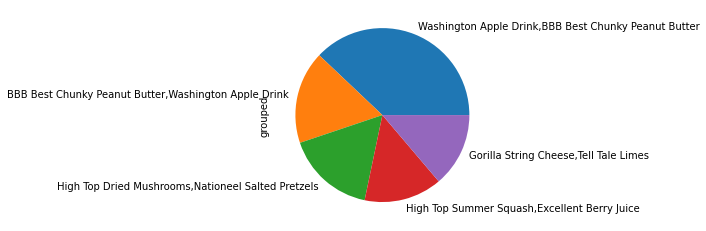

In [67]:
count = dup_order['grouped'].value_counts()[0:5].plot.pie()


**From the above pie diagram we can draw a conclusion that these products are most frequently Purchased together.**

In [68]:
count = Counter()

for row in dup_order['grouped']:
    row_list  = row.split(',')
    count.update(Counter(combinations(row_list,2)))
    
#check out the most common combination.
my_dict = {}
position = 1

for key, value in count.most_common(11):
    if position > 1:
        my_dict.update({key: value})
    position += 1
    
most_common_df = pd.DataFrame.from_dict(my_dict, orient='index', columns=['Count'])
most_common_df = most_common_df.reset_index().rename(columns={'index': 'Items'})

# To see all the contents of a row.
pd.options.display.max_colwidth = 1000


most_common_df

,Items,Count
0,"(Ebony Prepared Salad, Imagine Popsicles)",306
1,"(Better Fancy Canned Sardines, Ebony Prepared Salad)",302
2,"(Ebony Prepared Salad, Moms Sliced Turkey)",302
3,"(Better Fancy Canned Sardines, Imagine Popsicles)",285
4,"(Moms Sliced Turkey, Imagine Popsicles)",254
5,"(Imagine Popsicles, Ebony Prepared Salad)",251
6,"(Ebony Prepared Salad, Red Spade Turkey Hot Dogs)",243
7,"(Better Fancy Canned Sardines, Red Spade Foot-Long Hot Dogs)",239
8,"(Ebony Prepared Salad, Better Fancy Canned Sardines)",238
9,"(Imagine Popsicles, Red Spade Turkey Hot Dogs)",236


**The above products can be sold in a bundle or a combined package for discount since they are frequently purchased to geather.**

### Q5: What is the impact of discounts on margins?

In [69]:
data = sales_df.copy()

In [70]:
# Calculate total sales revenue and margins with and without discounts
revenue_before_discounts = data['Sales Amount Based on List Price'].sum().round(2)
revenue_after_discounts =  data['Sales Amount'].sum().round(2)

# Calculate total discount amount
total_discount = data['Discount Amount'].sum().round(2)

# Calculate the total cost of goods sold
cost = data['Sales Cost Amount'].sum().round(2)

# Calculate the total margin before and after discounts
margin_before_discounts = revenue_before_discounts - cost
margin_after_discounts = data['Sales Margin Amount'].sum()

# Calculate the margin with and without discounts
margin_pct_before_discounts = round((margin_before_discounts / revenue_before_discounts)*100,2)
margin_pct_after_discounts = round((margin_after_discounts / revenue_after_discounts)*100,2)

# Calculate the impact on margins
impact_on_margins = round((margin_pct_before_discounts - margin_pct_after_discounts),2)

# Compare the total sales revenue and margins with and without discounts
print("Total sales revenue before discounts: $", revenue_before_discounts)
print("Total discount amount: $", total_discount)
print("Total sales revenue after discounts: $", revenue_after_discounts)
print("Margin before discounts: {} %".format(margin_pct_before_discounts))
print("Margin after discounts: {} %".format(margin_pct_after_discounts))
print("Impact of discounts on margins: {}%".format(impact_on_margins))

Total sales revenue before discounts: $ 297031867.05
Total discount amount: $ 124498229.37
Total sales revenue after discounts: $ 172533637.68
Margin before discounts: 66.17 %
Margin after discounts: 41.76 %
Impact of discounts on margins: 24.41%


In [71]:

# Create a bar chart with margin before and after discounts
fig = go.Figure()
fig.add_trace(go.Bar(x=['Margin Before Discounts', 'Margin After Discounts'],
                     y=[margin_pct_before_discounts, margin_pct_after_discounts],
                    text=[margin_pct_before_discounts, margin_pct_after_discounts],
                    marker_color = ['orange', 'black']))

# Set the chart title and axes labels
fig.update_layout(title='Impact of Discounts on Margins',
                   xaxis_title='Margin',
                   yaxis_title='Percentage (%)')

# Show the chart
fig.show()

**Observations:**

The data suggests that the total sales revenue before discounts was 297.03 million , The total discount amount was 124.49 million, which resulted in the total sales revenue after discounts being 172.53 million.

The margin before discounts was 66.17%, while the margin after discounts was 41.76%. This indicates that the discounts had a significant impact on the margins, reducing them by 24.41%.

The insights that can be gleaned from this data are that while discounts may help drive sales, they can also significantly impact profit margins. It's important for businesses to carefully consider the impact of discounts on their margins before offering them, to ensure that they are still able to operate profitably.

### Q6: Is there any relationship between the price of an item and its sales volume and margin?

In [72]:
data=sales_df.copy()

In [73]:
# Calculate the correlation coefficient
corr = data[['Sales Quantity', 'Sales Margin Amount']].corrwith(data['Sales Amount'])
print(corr)

Sales Quantity         0.812984
Sales Margin Amount    0.973418
dtype: float64


In [74]:
fig = px.scatter(data, x='Sales Quantity', y='Sales Amount', trendline='ols', 
                 title='Linear Regression Plot for Sales Quantity vs. Sales Amount')
fig.update_layout(
    xaxis_title="Sales Quantity",
    yaxis_title="Sales Amount"
)

fig.update_traces(marker=dict(color='orange', size=5))

fig.show()

fig = px.scatter(data, x='Sales Margin Amount', y='Sales Amount', trendline='ols', 
                 title='Linear Regression Plot for Sales Margin Amount vs. Sales Amount')
fig.update_layout(
    xaxis_title="Sales Margin Amount",
    yaxis_title="Sales Amount"
)

fig.update_traces(marker=dict(color='black', size=5))

fig.show()

**Observations:**

We know the rules of correlation which takes the correlation coefficient (r) in to account and helps us decide that if the parameters we chose are positively, negatively or not correlated at all.

Following are the rules to decide:

- If the r (correlation coefficient) is **close to 1 or 1** the two parameters are **positively** correlated.


- If the r (correlation coefficient) is **close to -1 or -1** the two parameters are **negatively** correlated.


- If the r (correlation coefficient) is **close to 0 or 0** the two parameters are **hardly correlated** or **not correlated** at all.

 
The high correlation coefficient of Sales Margin Amount with sales amount (0.973418) indicates that the two variables are strongly correlated and tend to move together in the same direction. This suggests that there is a strong linear relationship between the Sales Margin Amount and the sales amount, and as the sales amount increases, the Sales Margin Amount tends to increase as well.

On the other hand, the correlation coefficient of Sales Quantity with sales amount (0.812984) also indicates a moderate positive correlation between the two variables. This suggests that there is a positive linear relationship between the Sales Quantity and the sales amount, but the relationship is not as strong as the one between Sales Margin Amount and sales amount.

Overall, these insights suggest that Sales Margin Amount may have a stronger impact on the sales amount than Sales Quantity, as the former is highly correlated with sales amount. However, it is important to note that correlation does not imply causation.